# Notebook 5: Test Exploratory Coding (Second Iteration)
This notebook documents the second batch of integrated coding with the VLM. This was applied to a random sample of 86 shots from 5 videos from outside the date range of the main dataset.

**Prompt List:**

_Location variable_

1. Prompt 4a

> You are provided a still image of a video. Your job is to analyze the backdrop of the image and classify it into the following three mutually exclusive location labels. Ignore any text overlay or captions. For the provided image, select the one category that best describes its background or setting: Graphics: Image is not live‑action footage or is artificial (e.g., animations, CGI, black screens) and hence cannot be set in a location; Outdoor: Image is set outdoors, where natural lighting, natural landscapes or exteriors of urban environments are visible; Indoors: Image is set indoors, where the backdrop is in interior locations or permanent structures such as studios, rooms and in confined spaces (eg tunnels). Artificial lighting may also be present. Respond with a Python-style tuple in the format: ("classification", "motivation") - "classification" must be one of: "Graphics", "Outdoor" or "Indoor"; "motivation" is a justification of your classification in 50 words or fewer, explaining what visual elements in the image led to your choice.

2. Prompt 4b (With context; Added after initial round of analysis)

> You are an expert annotator of social media videos. You are provided a still image from a scene in a video posted on the Israel Defence Force’s TikTok between 7 October 2023 to 7 October 2024. Your analysis of the setting of the image will enable understanding of their tendencies in their video production processes. Your job is to analyze the backdrop of the image and classify it into the following three mutually exclusive location labels. Ignore overlaid text or captions that may inform your classification. For the provided image, select the one category that best describes its setting: Graphics: Image is not live‑action footage or is artificial (e.g., animations, CGI, black screens) and hence cannot be discernably set in a location; Outdoor: Image is set outdoors with natural lighting and where natural landscapes or exteriors of urban environments may be visible; Indoors: Image is set indoors, where the backdrop is in interior locations or permanent structures such as studios, rooms and in confined spaces (eg tunnels). Artificial lighting may also be present. Analyze the provided still image and reply with one of these exact labels: ‘Graphics’, ‘Outdoor’ or ‘Indoor’.

_Combat presence variable_

2. Prompt 5a

> You are provided a still image of a video. Your job is to analyze the backdrop of the image and identify if there are explicit signs of combat in the setting. You will classify the image into the following three mutually exclusive categories. Ignore any overlaid text, captions or the clothes people are wearing. For the provided image, select the one category that best describes its the presence of combat: Graphics: Image is not live‑action footage or is artificial (e.g., animations, CGI, black screens) and hence cannot discernibly have combat presence; Combat: Image contains explicit signs of warfare, such as visible destruction, rubble, military hardware, weapons, traces of combat or troops in the background (excluding the speaker); Non-combat: Image does not contain explicit signs of warfare, destruction or traces of combat. Respond with a Python-style tuple in the format: ("classification", "motivation") - "classification" must be one of: "Graphics", "Combat" or "Non-combat"; "motivation" is a justification of your classification in 50 words or fewer, explaining what visual elements in the image led to your choice.

3. Prompt 5b (With context; Added after analysis)

> You are an expert annotator of social media videos. You are provided a still image from a scene in a video posted on the Israel Defence Force’s TikTok between 7 October 2023 to 7 October 2024. Your job is to analyze the backdrop of the image and identify if there are explicit signs of combat or warfare in the setting. You will classify the image into the following three mutually exclusive categories. Ignore any overlaid text, captions or the clothes the main subject is wearing. For the provided image, select the one category that best describes its the presence of combat: Graphics: Image is not live‑action footage or is artificial (e.g., animations, CGI, black screens) and hence cannot discernibly have combat presence; Combat: Image contains explicit signs of warfare, such as visible destruction, rubble, military hardware, weapons, traces of combat or troops in the background in action (excluding the speaker); Non-combat: Image does not contain explicit signs of warfare, destruction or traces of combat. Respond with a Python-style tuple in the format: ("classification", "motivation") - "classification" must be one of: "Graphics", "Combat" or "Non-combat"; "motivation" is a justification of your classification in 50 words or fewer, explaining what visual elements in the image led to your choice.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import face_recognition
import re
import ast
import krippendorff
import networkx as nx

In [75]:
# Establish directory
frames_folder = '/Users/mikechow.sg/Documents/03a UvA/03_Thesis/idf_spokespersonship/coding_sample/01b_test_sample_2'
coding_main_vlm_path = '/Users/mikechow.sg/Documents/03a UvA/03_Thesis/idf_spokespersonship/coding_sample/01b_test_sample_2/test_sample_scenes_2.csv'
coding_m_path = '/Users/mikechow.sg/Documents/03a UvA/03_Thesis/idf_spokespersonship/coding_sample/01b_test_sample_2/test_sample_scenes_2_m.csv'
coding_c_path = '/Users/mikechow.sg/Documents/03a UvA/03_Thesis/idf_spokespersonship/coding_sample/01b_test_sample_2/test_sample_scenes_2_c.csv'

# Clean up original VLM Data
This section takes the original annotated dateframe and cleans it

In [78]:
df_coding_main = pd.read_csv(coding_main_vlm_path)
df_coding_main

,id,url,from_dataset,start_frame,start_time,start_fps,end_frame,end_time,end_fps,scene_num,num_scenes_detected,total_video_frames,total_video_duration,post_ids,location_vlm_4a_tuple,combat_presence_vlm_5a_tuple,location_vlm_4b_tuple,combat_presence_vlm_5b_tuple
0,7452697976306191623.mp4_scene_1,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,0,00:00:00.000,30.000,165,00:00:05.500,30.000,1,9,1540,00:00:51.333,"7,4,5,2,6,9,7,9,7,6,3,0,6,1,9,1,6,2,3","(""Indoor"", ""The setting appears indoors with v...","(""Non-combat"", ""The image shows an individual ...","(""Indoor"", ""The image shows an interior settin...","(""Non-combat"", ""The backdrop shows an indoor s..."
1,7452697976306191623.mp4_scene_2,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,165,00:00:05.500,30.000,427,00:00:14.233,30.000,2,9,1540,00:00:51.333,"7,4,5,2,6,9,7,9,7,6,3,0,6,1,9,1,6,2,3","(""Indoor"", ""The image shows an individual wear...","(""Non-combat"", ""The image shows an individual ...","(""Indoor"", ""The background shows large windows...","(""Non-combat"", ""The backdrop shows an indoor s..."
2,7452697976306191623.mp4_scene_3,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,427,00:00:14.233,30.000,606,00:00:20.200,30.000,3,9,1540,00:00:51.333,"7,4,5,2,6,9,7,9,7,6,3,0,6,1,9,1,6,2,3","(""Indoor"", ""The setting appears to be indoors ...","(""Non-combat"", ""The image shows an individual ...","(""Indoor"", ""The image shows an interior settin...","(""Non-combat"", ""The backdrop shows an indoor s..."
3,7452697976306191623.mp4_scene_4,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,606,00:00:20.200,30.000,772,00:00:25.733,30.000,4,9,1540,00:00:51.333,"7,4,5,2,6,9,7,9,7,6,3,0,6,1,9,1,6,2,3","(""Indoor"", ""The setting appears to be indoors ...","(""Non-combat"", ""The image shows an individual ...","(""Indoor"", ""The background shows interior feat...","(""Non-combat"", ""The backdrop shows an indoor s..."
4,7452697976306191623.mp4_scene_5,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,772,00:00:25.733,30.000,1025,00:00:34.167,30.000,5,9,1540,00:00:51.333,"7,4,5,2,6,9,7,9,7,6,3,0,6,1,9,1,6,2,3","(""Indoor"", ""The image shows an interior settin...","(""Non-combat"", ""The image shows an individual ...","(""Indoor"", ""The background shows interior feat...","(""Non-combat"", ""The backdrop shows an indoor s..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,7441620184583998728.mp4_scene_17,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,540,00:00:22.523,23.976,677,00:00:28.237,23.976,17,20,775,00:00:32.324,"7,4,4,1,6,2,0,1,8,4,5,8,3,9,9,8,7,2,8","(""Outdoor"", ""The image shows natural lighting ...","(""Non-combat"", ""The image shows an individual ...","(""Outdoor"", ""The background shows natural ligh...","(""Non-combat"", ""The backdrop shows a natural s..."
82,7441620184583998728.mp4_scene_18,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,677,00:00:28.237,23.976,701,00:00:29.238,23.976,18,20,775,00:00:32.324,"7,4,4,1,6,2,0,1,8,4,5,8,3,9,9,8,7,2,8","(""Indoor"", ""The backdrop appears to be an indo...","(""Non-combat"", ""The backdrop appears to be a p...","(""Indoor"", ""The backdrop appears to be a plain...","(""Non-combat"", ""The backdrop appears to be a p..."
83,7441620184583998728.mp4_scene_19,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,701,00:00:29.238,23.976,732,00:00:30.531,23.976,19,20,775,00:00:32.324,"7,4,4,1,6,2,0,1,8,4,5,8,3,9,9,8,7,2,8","(""Outdoor"", ""The image shows natural lighting ...","(""Non-combat"", ""The backdrop shows a natural s...","(""Outdoor"", ""The image shows natural lighting ...","(""Non-combat"", ""The background shows a natural..."
84,7441620184583998728.mp4_scene_20,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,732,00:00:30.531,23.976,775,00:00:32.324,23.976,20,20,775,00:00:32.324,"7,4,4,1,6,2,0,1,8,4,5,8,3,9,9,8,7,2,8","(""Outdoor"", ""The image shows natural lighting ...","(""Non-combat"", ""The image shows a person outdo...","(""Outd

In [77]:
def safe_eval(value):
    try:
        return ast.literal_eval(value)
    except (ValueError, SyntaxError):
        print(f"Error parsing '{value}'")
        return None  # Return None or any fallback value for invalid strings


In [14]:
def tuple_split(tuple_str):
    try:
        tuple = ast.literal_eval(tuple_str)
    except (ValueError, SyntaxError):
        print(f"Error parsing '{tuple_str}'")

    if tuple is not None:
        result = tuple[0]
        motivation = tuple[1]

    return result, motivation

In [79]:
df_coding_main['location_vlm_4a'], df_coding_main['location_vlm_4a_motivation'] = zip(*df_coding_main['location_vlm_4a_tuple'].apply(tuple_split))
df_coding_main['location_vlm_4b'], df_coding_main['location_vlm_4b_motivation'] = zip(*df_coding_main['location_vlm_4b_tuple'].apply(tuple_split))


In [80]:
df_coding_main['combat_presence_vlm_5a'], df_coding_main['combat_presence_vlm_5a_motivation'] = zip(*df_coding_main['combat_presence_vlm_5a_tuple'].apply(tuple_split))
df_coding_main['combat_presence_vlm_5b'], df_coding_main['combat_presence_vlm_5b_motivation'] = zip(*df_coding_main['combat_presence_vlm_5b_tuple'].apply(tuple_split))



In [51]:
df_coding_main

,id,url,from_dataset,start_frame,start_time,start_fps,end_frame,end_time,end_fps,scene_num,...,combat_presence_vlm_5b_tuple,location_vlm_4b_tuple,location_vlm_4a,location_vlm_4a_motivation,location_vlm_4b,location_vlm_4b_motivation,combat_presence_vlm_5a,combat_presence_vlm_5a_motivation,combat_presence_vlm_5b,combat_presence_vlm_5b_motivation
0,7452697976306191623.mp4_scene_1,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,0,00:00:00.000,30.000,165,00:00:05.500,30.000,1,...,"(""Non-combat"", ""The backdrop shows an indoor s...","(""Indoor"", ""The setting appears indoors with v...",Indoor,The image shows an interior setting with visib...,Indoor,The setting appears indoors with visible inter...,Non-combat,The image shows an individual in military unif...,Non-combat,The backdrop shows an indoor setting with no v...
1,7452697976306191623.mp4_scene_2,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,165,00:00:05.500,30.000,427,00:00:14.233,30.000,2,...,"(""Non-combat"", ""The backdrop shows an indoor s...","(""Indoor"", ""The image shows an individual wear...",Indoor,The background shows large windows with natura...,Indoor,The image shows an individual wearing military...,Non-combat,The image shows an individual in military atti...,Non-combat,The backdrop shows an indoor setting with wind...
2,7452697976306191623.mp4_scene_3,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,427,00:00:14.233,30.000,606,00:00:20.200,30.000,3,...,"(""Non-combat"", ""The backdrop shows an indoor s...","(""Indoor"", ""The setting appears to be indoors ...",Indoor,The image shows an interior setting with artif...,Indoor,The setting appears to be indoors with artific...,Non-combat,The image shows an individual in military atti...,Non-combat,The backdrop shows an indoor setting with no v...
3,7452697976306191623.mp4_scene_4,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,606,00:00:20.200,30.000,772,00:00:25.733,30.000,4,...,"(""Non-combat"", ""The backdrop shows an indoor s...","(""Indoor"", ""The setting appears to be indoors ...",Indoor,The background shows interior features like wi...,Indoor,The setting appears to be indoors with artific...,Non-combat,The image shows an individual in military atti...,Non-combat,The backdrop shows an indoor setting with no v...
4,7452697976306191623.mp4_scene_5,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,772,00:00:25.733,30.000,1025,00:00:34.167,30.000,5,...,"(""Non-combat"", ""The backdrop shows an indoor s...","(""Indoor"", ""The image shows an interior settin...",Indoor,The background shows interior features such as...,Indoor,The image shows an interior setting with visib...,Non-combat,The image shows an individual in military atti...,Non-combat,The backdrop shows an indoor setting with no v...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,7441620184583998728.mp4_scene_17,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,540,00:00:22.523,23.976,677,00:00:28.237,23.976,17,...,"(""Non-combat"", ""The backdrop shows a natural s...","(""Outdoor"", ""The image shows natural lighting ...",Outdoor,The background shows natural lighting and tree...,Outdoor,The image shows natural lighting and visible t...,Non-combat,The image shows an individual outdoors with tr...,Non-combat,The backdrop shows a natural setting with tree...
82,7441620184583998728.mp4_scene_18,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,677,00:00:28.237,23.976,701,00:00:29.238,23.976,18,...,"(""Non-combat"", ""The backdrop appears to be a p...","(""Indoor"", ""The backdrop appears to be an indo...",Indoor,The backdrop appears to be a plain fabric curt...,Indoor,The backdrop appears to be an indoor setting w...,Non-combat,"The backdrop appears to be a plain, light-colo...",Non-combat,"The backdrop appears to be a plain, light-colo..."
83,7441620184583998728.mp4_scene_19,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,701,00:00:29.238,23.976,732,00:00:30.531,23.976,19,...,"(

# Bring in manually coded sheets

In [81]:
df_coding_m = pd.read_csv(coding_m_path)
df_coding_c = pd.read_csv(coding_c_path)

In [82]:
df_coding_main = pd.merge(df_coding_main, df_coding_m, how='left')
df_coding_main

,id,url,from_dataset,start_frame,start_time,start_fps,end_frame,end_time,end_fps,scene_num,...,location_vlm_4b,location_vlm_4b_motivation,combat_presence_vlm_5a,combat_presence_vlm_5a_motivation,combat_presence_vlm_5b,combat_presence_vlm_5b_motivation,spox_gender_m,shot_scale_m,location_m,combat_presence_m
0,7452697976306191623.mp4_scene_1,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,0,00:00:00.000,30.000,165,00:00:05.500,30.000,1,...,Indoor,The image shows an interior setting with visib...,Non-combat,The image shows an individual in military unif...,Non-combat,The backdrop shows an indoor setting with no v...,F,Selfie,Indoor,Non-combat
1,7452697976306191623.mp4_scene_2,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,165,00:00:05.500,30.000,427,00:00:14.233,30.000,2,...,Indoor,The background shows large windows with natura...,Non-combat,The image shows an individual in military atti...,Non-combat,The backdrop shows an indoor setting with wind...,F,Selfie,Indoor,Non-combat
2,7452697976306191623.mp4_scene_3,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,427,00:00:14.233,30.000,606,00:00:20.200,30.000,3,...,Indoor,The image shows an interior setting with artif...,Non-combat,The image shows an individual in military atti...,Non-combat,The backdrop shows an indoor setting with no v...,F,Selfie,Indoor,Non-combat
3,7452697976306191623.mp4_scene_4,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,606,00:00:20.200,30.000,772,00:00:25.733,30.000,4,...,Indoor,The background shows interior features like wi...,Non-combat,The image shows an individual in military atti...,Non-combat,The backdrop shows an indoor setting with no v...,F,Selfie,Indoor,Non-combat
4,7452697976306191623.mp4_scene_5,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,772,00:00:25.733,30.000,1025,00:00:34.167,30.000,5,...,Indoor,The background shows interior features such as...,Non-combat,The image shows an individual in military atti...,Non-combat,The backdrop shows an indoor setting with no v...,F,Selfie,Indoor,Non-combat
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,7441620184583998728.mp4_scene_17,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,540,00:00:22.523,23.976,677,00:00:28.237,23.976,17,...,Outdoor,The background shows natural lighting and tree...,Non-combat,The image shows an individual outdoors with tr...,Non-combat,The backdrop shows a natural setting with tree...,M,Medium close up,Outdoor,Non-combat
82,7441620184583998728.mp4_scene_18,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,677,00:00:28.237,23.976,701,00:00:29.238,23.976,18,...,Indoor,The backdrop appears to be a plain fabric curt...,Non-combat,"The backdrop appears to be a plain, light-colo...",Non-combat,"The backdrop appears to be a plain, light-colo...",M,Medium close up,Outdoor,Non-combat
83,7441620184583998728.mp4_scene_19,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,701,00:00:29.238,23.976,732,00:00:30.531,23.976,19,...,Outdoor,The image shows natural lighting and visible t...,Non-combat,The backdrop shows a natural setting with tree...,Non-combat,The background shows a natural setting with tr...,M,Medium close up,Outdoor,Non-combat
84,7441620184583998728.mp4_scene_20,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,732,00:00:30.531,23.976,775,00:00:32.324,23.976,20,...,Outdoor,The image shows natural lighting and visible t...,Non-combat,The image shows a person outdoors with trees a...,Non-combat,The backdrop shows a natural setting with tree...,M,Medium close up,Outdoor,Non-combat


In [83]:
df_coding_main = pd.merge(df_coding_main, df_coding_c, how='left')
df_coding_main

,id,url,from_dataset,start_frame,start_time,start_fps,end_frame,end_time,end_fps,scene_num,...,combat_presence_vlm_5b,combat_presence_vlm_5b_motivation,spox_gender_m,shot_scale_m,location_m,combat_presence_m,spox_gender_c,shot_scale_c,location_c,combat_presence_c
0,7452697976306191623.mp4_scene_1,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,0,00:00:00.000,30.000,165,00:00:05.500,30.000,1,...,Non-combat,The backdrop shows an indoor setting with no v...,F,Selfie,Indoor,Non-combat,F,Selfie,Indoor,Non-combat
1,7452697976306191623.mp4_scene_2,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,165,00:00:05.500,30.000,427,00:00:14.233,30.000,2,...,Non-combat,The backdrop shows an indoor setting with wind...,F,Selfie,Indoor,Non-combat,F,Selfie,Indoor,Non-combat
2,7452697976306191623.mp4_scene_3,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,427,00:00:14.233,30.000,606,00:00:20.200,30.000,3,...,Non-combat,The backdrop shows an indoor setting with no v...,F,Selfie,Indoor,Non-combat,F,Selfie,Indoor,Non-combat
3,7452697976306191623.mp4_scene_4,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,606,00:00:20.200,30.000,772,00:00:25.733,30.000,4,...,Non-combat,The backdrop shows an indoor setting with no v...,F,Selfie,Indoor,Non-combat,F,Selfie,Indoor,Non-combat
4,7452697976306191623.mp4_scene_5,7452697976306191623,dd01ff7a2a7ed42db656b1c7dbede342,772,00:00:25.733,30.000,1025,00:00:34.167,30.000,5,...,Non-combat,The backdrop shows an indoor setting with no v...,F,Selfie,Indoor,Non-combat,F,Selfie,Indoor,Non-combat
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,7441620184583998728.mp4_scene_17,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,540,00:00:22.523,23.976,677,00:00:28.237,23.976,17,...,Non-combat,The backdrop shows a natural setting with tree...,M,Medium close up,Outdoor,Non-combat,M,Medium close up,Outdoor,Non-combat
82,7441620184583998728.mp4_scene_18,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,677,00:00:28.237,23.976,701,00:00:29.238,23.976,18,...,Non-combat,"The backdrop appears to be a plain, light-colo...",M,Medium close up,Outdoor,Non-combat,M,Medium close up,Outdoor,Non-combat
83,7441620184583998728.mp4_scene_19,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,701,00:00:29.238,23.976,732,00:00:30.531,23.976,19,...,Non-combat,The background shows a natural setting with tr...,M,Medium close up,Outdoor,Non-combat,M,Medium close up,Outdoor,Non-combat
84,7441620184583998728.mp4_scene_20,7441620184583998728,dd01ff7a2a7ed42db656b1c7dbede342,732,00:00:30.531,23.976,775,00:00:32.324,23.976,20,...,Non-combat,The backdrop shows a natural setting with tree...,M,Medium close up,Outdoor,Non-combat,M,Medium close up,Outdoor,Non-combat


In [84]:
print(df_coding_main['location_m'].value_counts())
print(df_coding_main['location_c'].value_counts())
print(df_coding_main['location_vlm_4a'].value_counts())

location_m
Indoor      43
Outdoor     41
Graphics     2
Name: count, dtype: int64
location_c
Indoor      44
Outdoor     40
Graphics     2
Name: count, dtype: int64
location_vlm_4a
Indoor      57
Outdoor     25
Graphics     4
Name: count, dtype: int64


In [85]:
print(df_coding_main['combat_presence_m'].value_counts())
print(df_coding_main['combat_presence_c'].value_counts())
print(df_coding_main['combat_presence_vlm_5a'].value_counts())

combat_presence_m
Non-combat    73
Combat        11
Graphics       2
Name: count, dtype: int64
combat_presence_c
Non-combat    73
Combat        11
Graphics       2
Name: count, dtype: int64
combat_presence_vlm_5a
Non-combat    80
Combat         6
Name: count, dtype: int64


In [86]:
df_coding_main.to_csv('/Users/mikechow.sg/Documents/03a UvA/03_Thesis/idf_spokespersonship/coding_sample/01b_test_sample_2/test_sample_scenes_2_merged.csv', index=False)

# Analysis

In [87]:
df_coding = pd.read_csv('/Users/mikechow.sg/Documents/03a UvA/03_Thesis/idf_spokespersonship/coding_sample/01b_test_sample_2/test_sample_scenes_2_merged.csv')

In [40]:
def preprocess_for_alpha(df):
    """
    Preprocess DataFrame columns to encode categorical values as numeric.
    This dynamically handles categorical data and missing values (NaN).
    """
    df_processed = df.copy()

    # Use pandas' factorization to encode categories into integer values
    for column in df_processed.columns:
        df_processed[column], _ = pd.factorize(df_processed[column], use_na_sentinel=True)
        # Replace factorized -1 (used for NaN) with np.nan for proper handling
        # df_processed[column] = df_processed[column].replace(-1, np.nan)

    return df_processed


def calc_alpha(df, level_of_measurement='nominal'):

    # Preprocess the data
    # df_numeric = preprocess_for_alpha(df)

    ratings = df.to_numpy().T

    alpha = krippendorff.alpha(ratings, level_of_measurement=level_of_measurement)
    # print(f"Krippendorff's Alpha: {alpha}")
    return alpha




In [110]:
# Manually refactor code categories

location_refactor = {'Graphics' : 1,
                    'Indoor': 2,
                    'Outdoor': 3,
                    'Uncertain': np.nan}

combat_presence_refactor = {'Graphics' : 1,
                    'Combat': 2,
                    'Non-combat': 3,
                    'Uncertain': np.nan}



In [121]:
# Check Intercoder reliability

# Define check label
df_intercoder_alpha = pd.DataFrame([

    {'column_1':'location_m','column_2':'location_c','type':'location'},
    {'column_1':'location_m','column_2':'location_vlm_4a','type':'location'},
    {'column_1':'location_c','column_2':'location_vlm_4a','type':'location'},


    {'column_1':'combat_presence_m','column_2':'combat_presence_c','type':'combat_presence'},
    {'column_1':'combat_presence_m','column_2':'combat_presence_vlm_5a','type':'combat_presence'},
    {'column_1':'combat_presence_c','column_2':'combat_presence_vlm_5a','type':'combat_presence'},


])


In [122]:
for i, row in df_intercoder_alpha.iterrows():
    column_1 = row['column_1']
    column_2 = row['column_2']
    coding_type = row['type']
    if coding_type == 'location':
        refactor_dict = location_refactor
    elif coding_type == 'combat_presence':
        refactor_dict = combat_presence_refactor

    df_intercoder = df_coding_main[[column_1, column_2]].copy()
    df_intercoder[column_1] =  df_intercoder[column_1].map(refactor_dict)
    df_intercoder[column_2] =  df_intercoder[column_2].map(refactor_dict)


    df_intercoder = df_intercoder.replace(-1, np.nan)

    # print(df_intercoder)

    df_intercoder_alpha.loc[i, 'intercoder_alpha'] = calc_alpha(df_intercoder[[column_1, column_2]])



In [123]:
df_intercoder_alpha

,column_1,column_2,type,intercoder_alpha
0,location_m,location_c,location,0.977847
1,location_m,location_vlm_4a,location,0.594787
2,location_c,location_vlm_4a,location,0.615527
3,combat_presence_m,combat_presence_c,combat_presence,1.000000
4,combat_presence_m,combat_presence_vlm_5a,combat_presence,0.476709
5,combat_presence_c,combat_presence_vlm_5a,combat_presence,0.476709


The Human-Human agreement is almost perfect. However, the agreement with the VLM has dropped, quite sharply for the location variable.

In [63]:
# Visualize network diagrams
def viz_agreement_network(df, output_path=None):

    # Initialize the graph
    G = nx.Graph()

    # List of nodes
    nodes = list(set(df['column_1'].tolist() + df['column_2'].tolist()))
    G.add_nodes_from(nodes)

    # Add edges with weights
    for i, row in df.iterrows():
        G.add_edge(row['column_1'], row['column_2'], weight=row['intercoder_alpha'])

    # Plot the graph
    plt.figure(figsize=(10,10))
    pos = nx.spring_layout(G)  # Layout algorithm for positions
    edges = G.edges(data=True)

    # Prepare edge widths based on intercoder_alpha
    widths = [d['weight'] * 30 for (u, v, d) in edges]  # multiplied for visibility

    nx.draw(G, pos, with_labels=True, node_size=2000, node_color='skyblue',
            width=widths, edge_color='blue', alpha=0.6,
            font_size=10, font_weight='bold')

    # # Add edge labels to show scores
    # edge_labels = {(u, v): f"{d['weight']:.2f}" for u, v, d in edges}
    # nx.draw_network_labels(G, pos, edge_labels=edge_labels, font_color='red')

    plt.title("Intercoder Agreement Network")
    plt.axis('off')
    if output_path is not None:
        plt.savefig(output_path)
    plt.show()

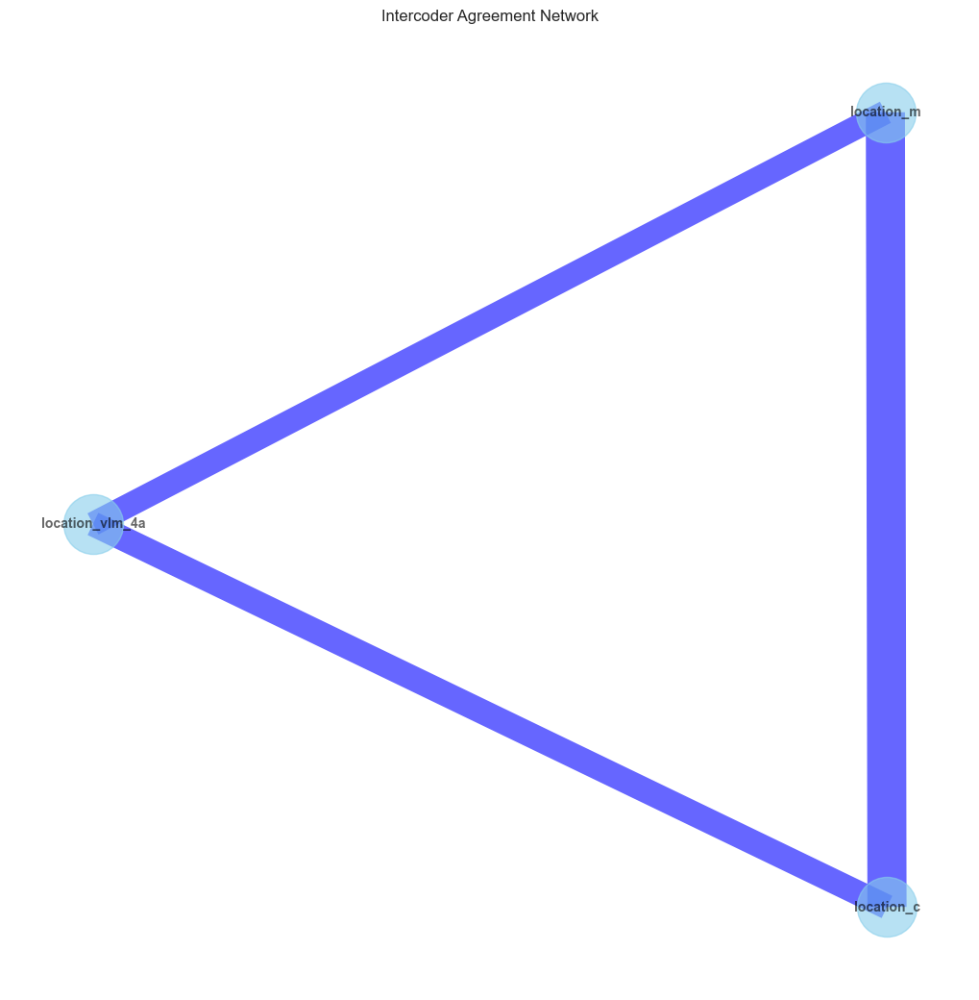

In [92]:
df_location_agreement = df_intercoder_alpha.iloc[0:3]
viz_agreement_network(df_location_agreement, '/Users/mikechow.sg/Documents/03a UvA/03_Thesis/idf_spokespersonship/coding_sample/01b_test_sample_2/location_agreement_network_1.svg')

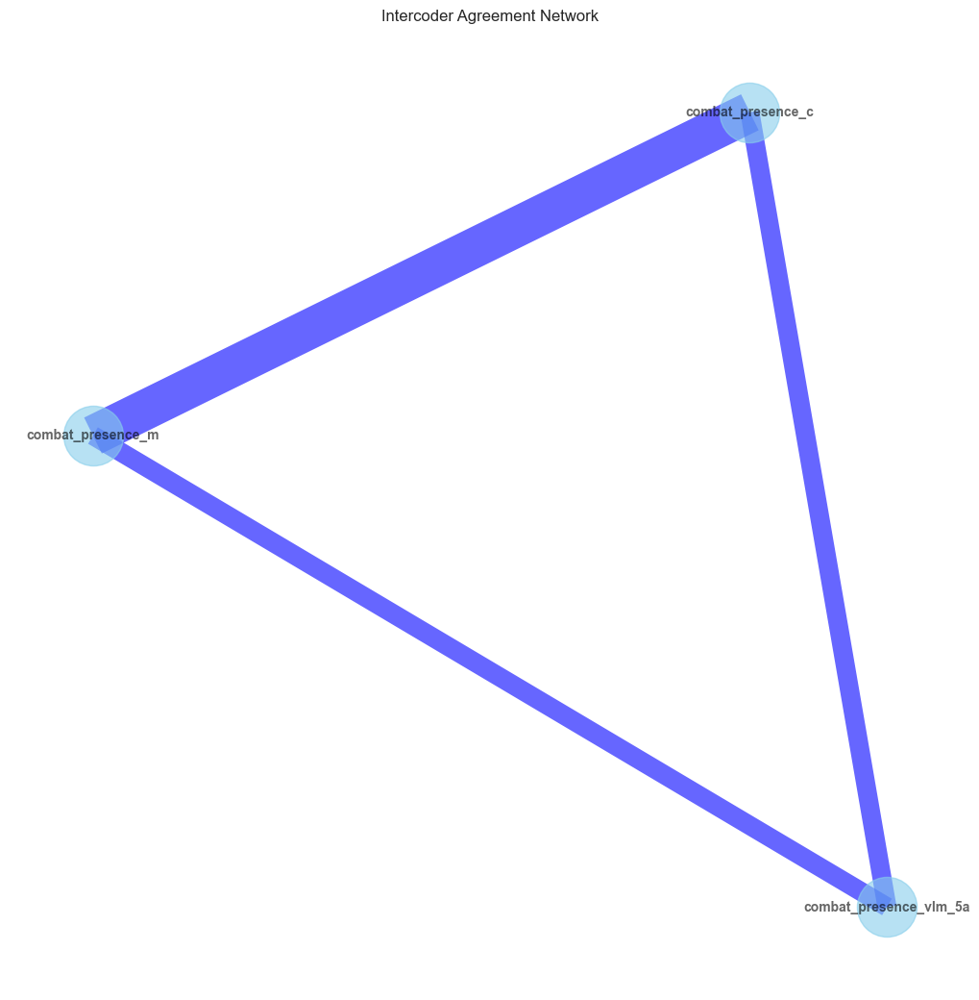

In [93]:
df_combat_presence_agreement = df_intercoder_alpha.iloc[3:]
viz_agreement_network(df_combat_presence_agreement, '/Users/mikechow.sg/Documents/03a UvA/03_Thesis/idf_spokespersonship/coding_sample/01b_test_sample_2/combat_agreement_network_1.svg')

# Visualize with motivation
Once again we visualize the results and motivations

In [67]:
import textwrap

In [ ]:
# Visualize each prediction (location and combat presence)
for index, scene in df_coding_main.iterrows():
    video_id = scene['url']
    scene_id = scene['id']

    cleaned_id = re.sub(r'\.mp4', '', scene_id)
    image_path = os.path.join(frames_folder, str(video_id), f'{cleaned_id}.jpeg')
    image = face_recognition.load_image_file(image_path) # load image

    plt.figure(figsize=(10, 5))
    plt.title(f"Coding result for {scene_id}", fontsize=12)
    plt.axis('off')
    plt.imshow(image)

    # Set up textwrap
    max_width = 30

    location_m = scene['location_m']
    location_c = scene['location_c']
    location_vlm = scene['location_vlm_4a']
    location_vlm_motivate = scene['location_vlm_4a_motivation']
    location_wrapped_motivation = textwrap.fill(location_vlm_motivate, width=max_width)

    if location_m == location_c:
        location_human_match = 'Match'
    else:
        location_human_match = 'No match'

    if location_m == location_vlm and location_c == location_vlm:
        location_vlm_match = 'Match'
    else:
        location_vlm_match = 'No match'


    combat_presence_m = scene['combat_presence_m']
    combat_presence_c = scene['combat_presence_c']
    combat_presence_vlm = scene['combat_presence_vlm_5a']
    combat_presence_vlm_motivate = scene['combat_presence_vlm_5a_motivation']
    combat_wrapped_motivation = textwrap.fill(combat_presence_vlm_motivate, width=max_width)

    if combat_presence_m == combat_presence_c:
        combat_human_match = 'Match'
    else:
        combat_human_match = 'No match'

    if combat_presence_m == combat_presence_vlm and combat_presence_c == combat_presence_vlm:
        combat_vlm_match = 'Match'
    else:
        combat_vlm_match = 'No match'


    annotation = f'Location:\nPrimary Coder: {location_m} \nSecondary Coder: {location_c}\n' \
    f'Human coder match: {location_human_match}\n\n' \
    f'VLM: {location_vlm}\nMotivation: {location_wrapped_motivation}\n' \
    f'VLM match: {location_vlm_match}\n\n' \
    f'Combat Presence:\nPrimary Coder: {combat_presence_m} \nSecondary Coder: {combat_presence_c}\n' \
    f'Human coder match: {combat_human_match}\n\n' \
    f'VLM: {combat_presence_vlm}\nMotivation: {combat_wrapped_motivation}\n' \
    f'VLM match: {combat_vlm_match}'
    # Annotate on the middle-right side of the image
    plt.annotate(
        annotation,
        xy=(1.05, 0.5),  # Position: 1.05 means slightly to the right of the axes
        xycoords='axes fraction',  # Position relative to axes (not data coordinates)
        fontsize=10,
        ha='left',  # Align text to the left
        va='center',  # Vertically centered
        bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white')  # Add highlight box
    )
    # Adjust spacing
    plt.grid(False)
    plt.tight_layout()
    plt.savefig(f'/Users/mikechow.sg/Documents/03a UvA/03_Thesis/idf_spokespersonship/coding_sample/01b_test_sample_2/coding_results/{scene_id}_coding_result.jpeg')
    plt.show()




# Repeat analysis with new prompts
In an effort to improve the agreement, we tried to include research context to see if we can improve it.

In [124]:
# Check Intercoder reliability

# Define check label
df_intercoder_alpha = pd.concat([df_intercoder_alpha, pd.DataFrame([

    {'column_1': 'location_m', 'column_2': 'location_vlm_4b', 'type': 'location'},
    {'column_1': 'location_c', 'column_2': 'location_vlm_4b', 'type': 'location'},
    # {'column_1': 'location_vlm_4a', 'column_2': 'location_vlm_4b', 'type': 'location'},

    {'column_1': 'combat_presence_m', 'column_2': 'combat_presence_vlm_5b', 'type': 'combat_presence'},
    {'column_1': 'combat_presence_c', 'column_2': 'combat_presence_vlm_5b', 'type': 'combat_presence'},
    # {'column_1': 'combat_presence_vlm_5a', 'column_2': 'combat_presence_vlm_5b', 'type': 'combat_presence'},

])], ignore_index=True)

for i, row in df_intercoder_alpha.iterrows():
    column_1 = row['column_1']
    column_2 = row['column_2']
    coding_type = row['type']
    if coding_type == 'location':
        refactor_dict = location_refactor
    elif coding_type == 'combat_presence':
        refactor_dict = combat_presence_refactor

    df_intercoder = df_coding_main[[column_1, column_2]].copy()
    df_intercoder[column_1] = df_intercoder[column_1].map(refactor_dict)
    df_intercoder[column_2] = df_intercoder[column_2].map(refactor_dict)

    df_intercoder = df_intercoder.replace(-1, np.nan)

    # print(df_intercoder)

    df_intercoder_alpha.loc[i, 'intercoder_alpha'] = calc_alpha(df_intercoder[[column_1, column_2]])



In [125]:
df_intercoder_alpha

,column_1,column_2,type,intercoder_alpha
0,location_m,location_c,location,0.977847
1,location_m,location_vlm_4a,location,0.594787
2,location_c,location_vlm_4a,location,0.615527
3,combat_presence_m,combat_presence_c,combat_presence,1.000000
4,combat_presence_m,combat_presence_vlm_5a,combat_presence,0.476709
5,combat_presence_c,combat_presence_vlm_5a,combat_presence,0.476709
6,location_m,location_vlm_4b,location,0.679604
7,location_c,location_vlm_4b,location,0.701170
8,combat_presence_m,combat_presence_vlm_5b,combat_presence,0.596562
9,combat_presence_c,combat_presence_vlm_5b,combat_presence,0.596562


This time, the agreement scores did in fact improve with the inclusion of research context.

In [126]:
# We can visualize the shift (from the first iteration as well)

# Add pairing data
for i, row in df_intercoder_alpha.iterrows():
    column_1 = row['column_1']
    column_2 = row['column_2']
    if column_1[-1:] == 'm' and column_2[-1:] == 'c':
        # Means both human coders
        permutation = 'Pri-Sec'
        df_intercoder_alpha.loc[i, 'permutation'] = permutation
    elif column_1[-1:] == 'm' and 'vlm' in column_2:
        permutation = 'Pri-VLM'
        df_intercoder_alpha.loc[i, 'permutation'] = permutation
    elif column_1[-1:] == 'c' and 'vlm' in column_2:
        permutation = 'Sec-VLM'
        df_intercoder_alpha.loc[i, 'permutation'] = permutation
    else:
        df_intercoder_alpha.drop(i, inplace=True) # Drop VLM to VLM comparison


    # Set iteration stage
    if column_2[-1:] == 'a' and 'vlm' in column_2:
        iteration = '2a'
        df_intercoder_alpha.loc[i, 'iteration'] = iteration
    elif column_2[-1:] == 'b' and 'vlm' in column_2:
        iteration = '2b'
        df_intercoder_alpha.loc[i, 'iteration'] = iteration
    else:
        # Make a copy of the row (Human-Human) but change the iteration to 2b so it can still be mapped
        iteration = '2a'
        df_intercoder_alpha.loc[i, 'iteration'] = iteration
        df_intercoder_alpha = pd.concat([df_intercoder_alpha, pd.DataFrame([{'column_1': row['column_1'],
                                                                             'column_2': row['column_2'],
                                                                             'type': row['type'],
                                                                             'intercoder_alpha': row['intercoder_alpha'],
                                                                             'permutation': 'Pri-Sec',
                                                                             'iteration': '2b'
                                                                             }])],ignore_index=True)


df_intercoder_alpha


,column_1,column_2,type,intercoder_alpha,permutation,iteration
0,location_m,location_c,location,0.977847,Pri-Sec,2a
1,location_m,location_vlm_4a,location,0.594787,Pri-VLM,2a
2,location_c,location_vlm_4a,location,0.615527,Sec-VLM,2a
3,combat_presence_m,combat_presence_c,combat_presence,1.000000,Pri-Sec,2a
4,combat_presence_m,combat_presence_vlm_5a,combat_presence,0.476709,Pri-VLM,2a
5,combat_presence_c,combat_presence_vlm_5a,combat_presence,0.476709,Sec-VLM,2a
6,location_m,location_vlm_4b,location,0.679604,Pri-VLM,2b
7,location_c,location_vlm_4b,location,0.701170,Sec-VLM,2b
8,combat_presence_m,combat_presence_vlm_5b,combat_presence,0.596562,Pri-VLM,2b
9,combat_presence_c,combat_presence_vlm_5b,combat_presence,0.596562,Sec-VLM,2b


In [127]:
# Manually write in first iteration results from Notebook 4
df_first_round = pd.DataFrame([{'column_1': 'location_m',
                   'column_2': 'location_c',
                   'type': 'location',
                   'intercoder_alpha': 0.804505,
                   'permutation': 'Pri-Sec',
                   },
                  {'column_1': 'location_m',
                   'column_2': 'location_vlm_3b',
                   'type': 'location',
                   'intercoder_alpha': 0.895186,
                   'permutation': 'Pri-VLM',
                   },
                  {'column_1': 'location_c',
                   'column_2': 'location_vlm_3b',
                   'type': 'location',
                   'intercoder_alpha': 0.827614,
                   'permutation': 'Sec-VLM',
                   },

                  {'column_1': 'combat_presence_m',
                   'column_2': 'combat_presence_c',
                   'type': 'combat_presence',
                   'intercoder_alpha': 0.777542,
                   'permutation': 'Pri-Sec',
                   },
                  {'column_1': 'combat_presence_m',
                   'column_2': 'combat_presence_vlm_3b',
                   'type': 'combat_presence',
                   'intercoder_alpha': 0.443086,
                   'permutation': 'Pri-VLM',
                   },
                  {'column_1': 'combat_presence_c',
                   'column_2': 'combat_presence_vlm_3b',
                   'type': 'combat_presence',
                   'intercoder_alpha': 0.650875,
                   'permutation': 'Sec-VLM',
                   },
                  ])
df_first_round['iteration'] = '1'
df_first_round

,column_1,column_2,type,intercoder_alpha,permutation,iteration
0,location_m,location_c,location,0.804505,Pri-Sec,1
1,location_m,location_vlm_3b,location,0.895186,Pri-VLM,1
2,location_c,location_vlm_3b,location,0.827614,Sec-VLM,1
3,combat_presence_m,combat_presence_c,combat_presence,0.777542,Pri-Sec,1
4,combat_presence_m,combat_presence_vlm_3b,combat_presence,0.443086,Pri-VLM,1
5,combat_presence_c,combat_presence_vlm_3b,combat_presence,0.650875,Sec-VLM,1


In [128]:
df_intercoder = pd.concat([df_intercoder_alpha, df_first_round], ignore_index=True)
df_intercoder

,column_1,column_2,type,intercoder_alpha,permutation,iteration
0,location_m,location_c,location,0.977847,Pri-Sec,2a
1,location_m,location_vlm_4a,location,0.594787,Pri-VLM,2a
2,location_c,location_vlm_4a,location,0.615527,Sec-VLM,2a
3,combat_presence_m,combat_presence_c,combat_presence,1.000000,Pri-Sec,2a
4,combat_presence_m,combat_presence_vlm_5a,combat_presence,0.476709,Pri-VLM,2a
5,combat_presence_c,combat_presence_vlm_5a,combat_presence,0.476709,Sec-VLM,2a
6,location_m,location_vlm_4b,location,0.679604,Pri-VLM,2b
7,location_c,location_vlm_4b,location,0.701170,Sec-VLM,2b
8,combat_presence_m,combat_presence_vlm_5b,combat_presence,0.596562,Pri-VLM,2b
9,combat_presence_c,combat_presence_vlm_5b,combat_presence,0.596562,Sec-VLM,2b


In [139]:
# Export
df_intercoder.to_csv('/Users/mikechow.sg/Documents/03a UvA/03_Thesis/idf_spokespersonship/coding_sample/01b_test_sample_2/test_coding_agr.csv', index=False)

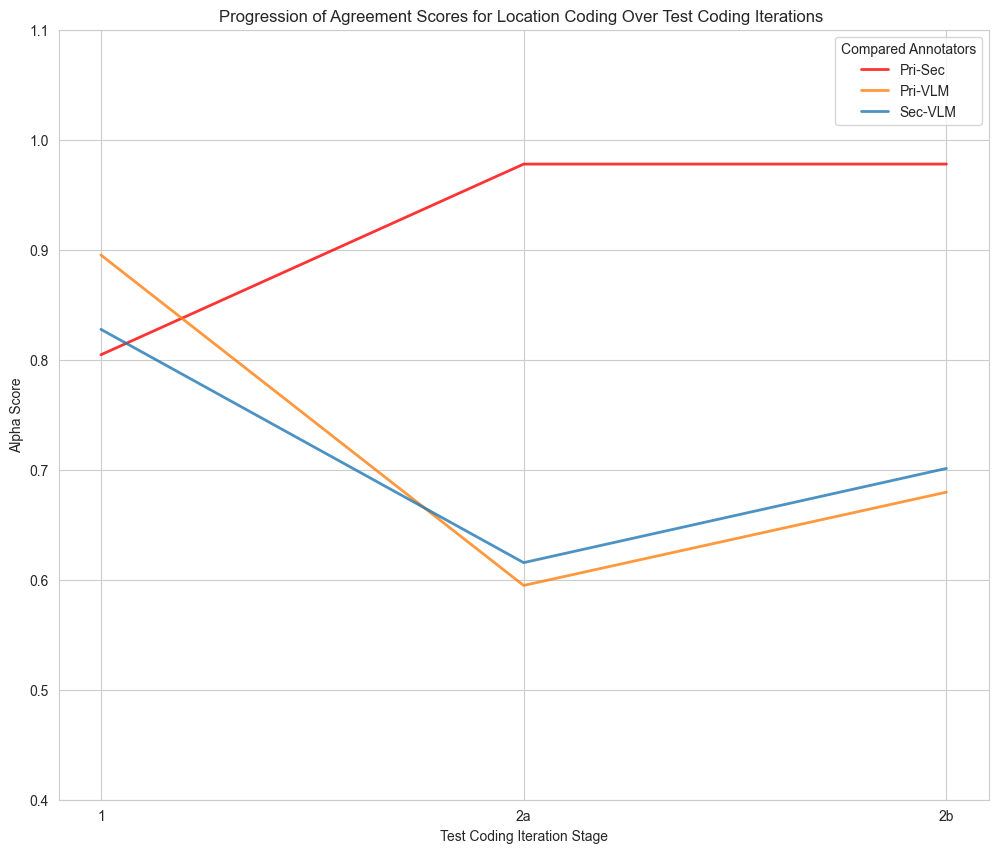

In [136]:
# Plot change for location
plt.figure(figsize=(12, 10))
df_intercoder_change = df_intercoder[df_intercoder['type'] == 'location']

# Color dictionary for permutation
perm_color = {'Pri-Sec': 'red',
              'Pri-VLM': 'tab:orange',
              'Sec-VLM': 'tab:blue',}

for i, permutation in enumerate(perm_color.keys()):
    df_perm = df_intercoder_change[df_intercoder_change['permutation'] == permutation]
    # Sort by iteration
    df_perm = df_perm.sort_values(by='iteration')
    # Plot change in agreement
    plt.plot(df_perm['iteration'],
             df_perm['intercoder_alpha'],
             # marker='o',
             linewidth=2,
             linestyle='-',
             color=perm_color[permutation],
             label=f'{permutation}',
             alpha=0.8)

plt.xlabel('Test Coding Iteration Stage')
plt.ylabel('Alpha Score')
plt.ylim(0.4,1.1)
plt.title('Progression of Agreement Scores for Location Coding Over Test Coding Iterations ')
plt.legend(title='Compared Annotators')
plt.grid(True)
plt.savefig('/Users/mikechow.sg/Documents/03a UvA/03_Thesis/idf_spokespersonship/coding_sample/01b_test_sample_2/agreement_progresion_location.svg',dpi=300)
plt.show()

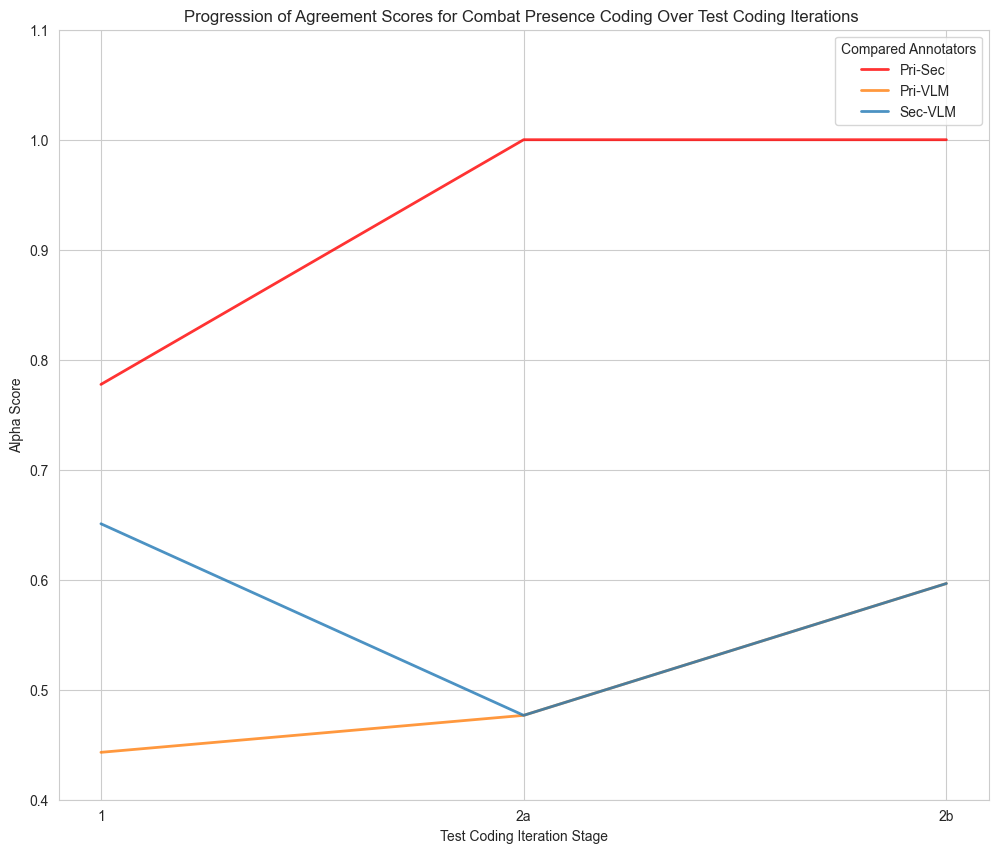

In [135]:
# Plot change for location
plt.figure(figsize=(12, 10))
df_intercoder_change = df_intercoder[df_intercoder['type'] == 'combat_presence']

# Color dictionary for permutation
perm_color = {'Pri-Sec': 'red',
              'Pri-VLM': 'tab:orange',
              'Sec-VLM': 'tab:blue',}

for i, permutation in enumerate(perm_color.keys()):
    df_perm = df_intercoder_change[df_intercoder_change['permutation'] == permutation]
    # Sort by iteration
    df_perm = df_perm.sort_values(by='iteration')
    # Plot change in agreement
    plt.plot(df_perm['iteration'],
             df_perm['intercoder_alpha'],
             # marker='o',
             linewidth=2,
             linestyle='-',
             color=perm_color[permutation],
             label=f'{permutation}',
             alpha=0.8)

plt.xlabel('Test Coding Iteration Stage')
plt.ylabel('Alpha Score')
plt.title('Progression of Agreement Scores for Combat Presence Coding Over Test Coding Iterations ')
plt.legend(title='Compared Annotators')
plt.grid(True)
plt.ylim(0.4,1.1)

plt.savefig('/Users/mikechow.sg/Documents/03a UvA/03_Thesis/idf_spokespersonship/coding_sample/01b_test_sample_2/agreement_progresion_combat.svg',dpi=300)
plt.show()

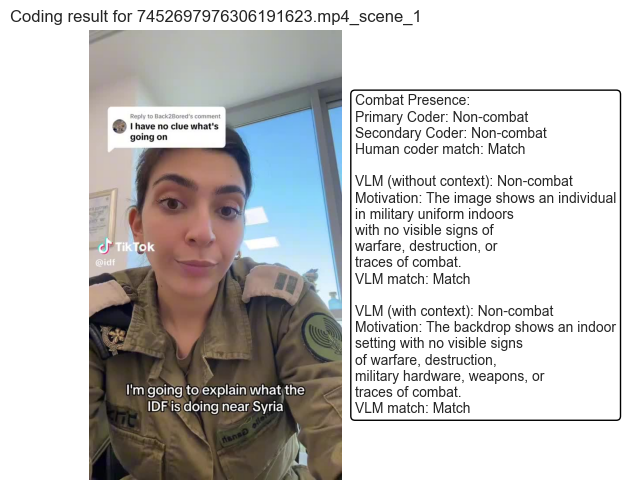

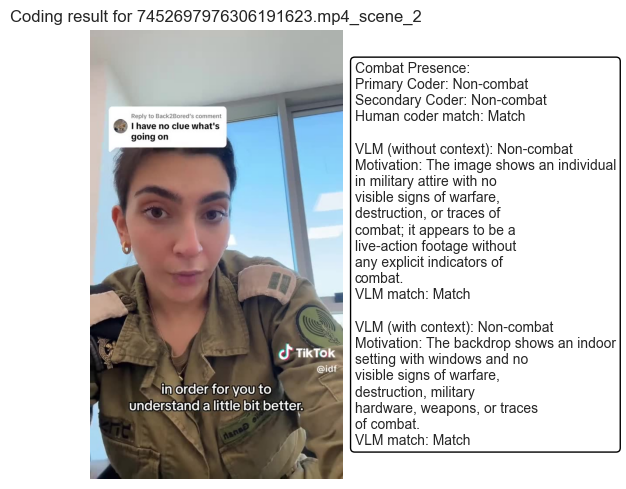

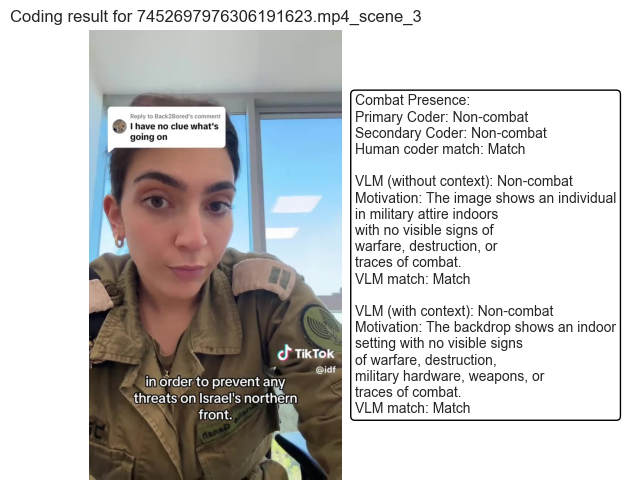

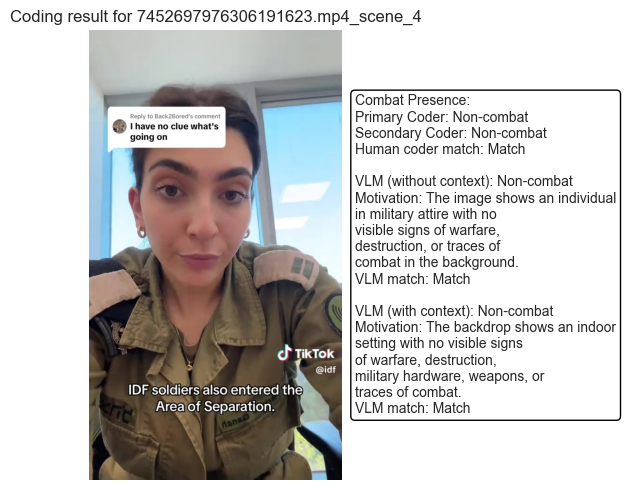

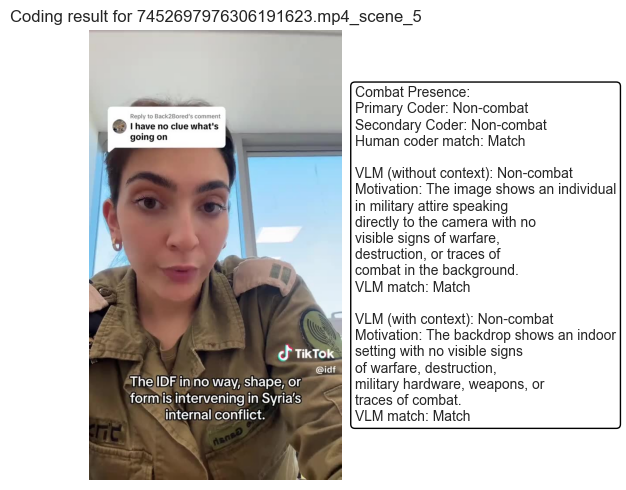

...

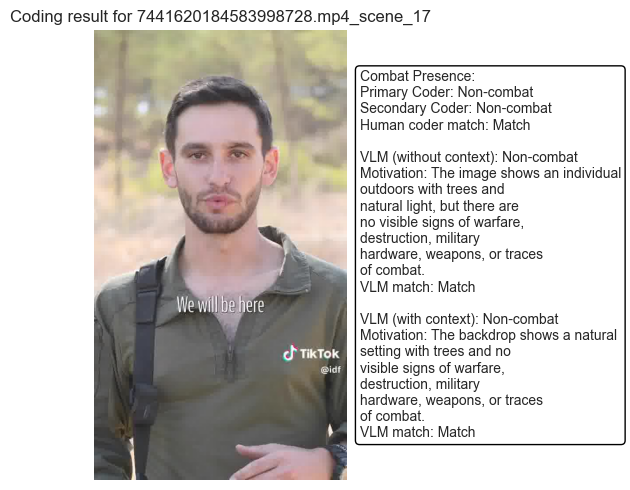

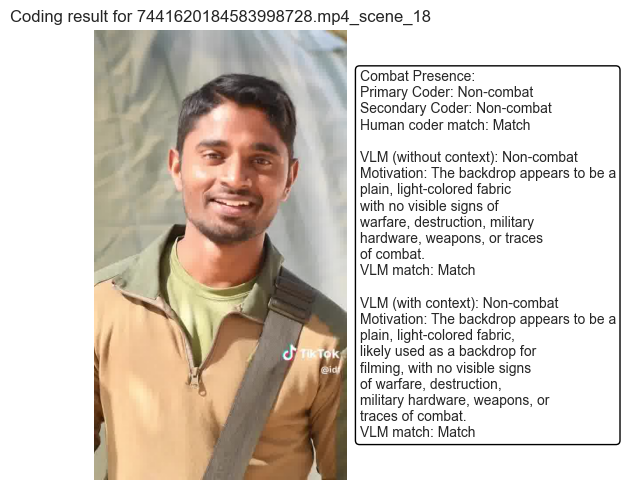

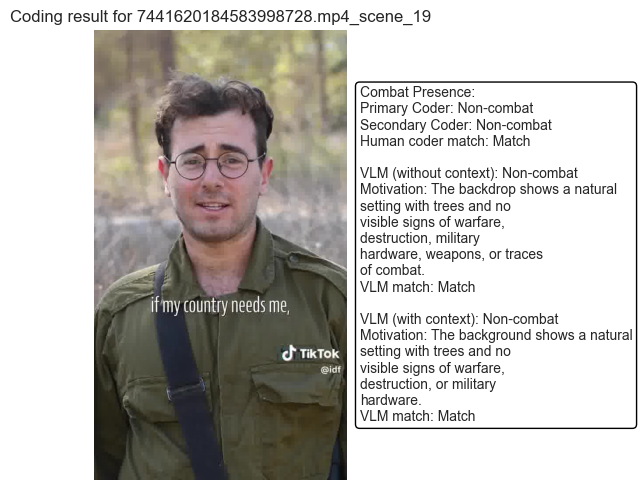

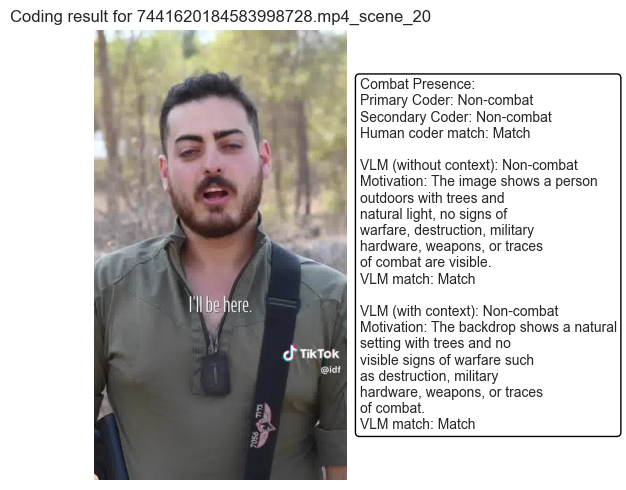

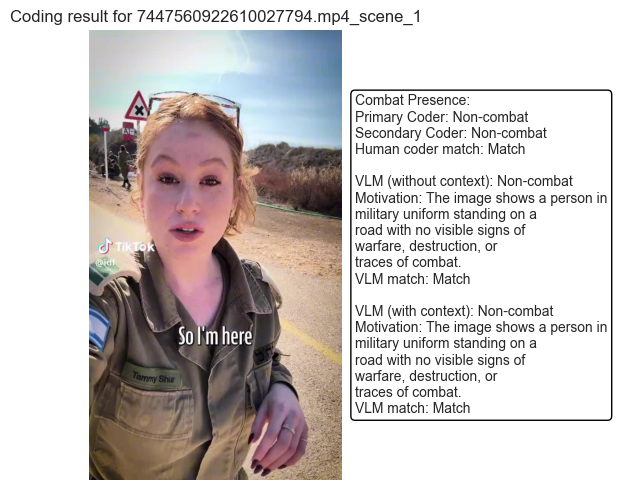

In [96]:
# Compare results from first and second prompt for combat presence
# Visualize each prediction (=combat presence)
for index, scene in df_coding_main.iterrows():
    video_id = scene['url']
    scene_id = scene['id']

    cleaned_id = re.sub(r'\.mp4', '', scene_id)
    image_path = os.path.join(frames_folder, str(video_id), f'{cleaned_id}.jpeg')
    image = face_recognition.load_image_file(image_path) # load image

    plt.figure(figsize=(10, 5))
    plt.title(f"Coding result for {scene_id}", fontsize=12)
    plt.axis('off')
    plt.imshow(image)

    # Set up textwrap
    max_width = 30

    # location_m = scene['location_m']
    # location_c = scene['location_c']
    # location_vlm = scene['location_vlm_4a']
    # location_vlm_motivate = scene['location_vlm_4a_motivation']
    # location_wrapped_motivation = textwrap.fill(location_vlm_motivate, width=max_width)
    #
    # if location_m == location_c:
    #     location_human_match = 'Match'
    # else:
    #     location_human_match = 'No match'
    #
    # if location_m == location_vlm and location_c == location_vlm:
    #     location_vlm_match = 'Match'
    # else:
    #     location_vlm_match = 'No match'


    combat_presence_m = scene['combat_presence_m']
    combat_presence_c = scene['combat_presence_c']
    combat_presence_vlm_1 = scene['combat_presence_vlm_5a']
    combat_presence_vlm_motivate_1 = scene['combat_presence_vlm_5a_motivation']
    combat_wrapped_motivation_1 = textwrap.fill(combat_presence_vlm_motivate_1, width=max_width)

    if combat_presence_m == combat_presence_c:
        combat_human_match = 'Match'
    else:
        combat_human_match = 'No match'

    if combat_presence_m == combat_presence_vlm_1 and combat_presence_c == combat_presence_vlm_1:
        combat_vlm_match_1 = 'Match'
    else:
        combat_vlm_match_1 = 'No match'

    combat_presence_m = scene['combat_presence_m']
    combat_presence_c = scene['combat_presence_c']
    combat_presence_vlm_2 = scene['combat_presence_vlm_5b']
    combat_presence_vlm_motivate_2 = scene['combat_presence_vlm_5b_motivation']
    combat_wrapped_motivation_2 = textwrap.fill(combat_presence_vlm_motivate_2, width=max_width)

    if combat_presence_m == combat_presence_vlm_2 and combat_presence_c == combat_presence_vlm_2:
        combat_vlm_match_2 = 'Match'
    else:
        combat_vlm_match_2 = 'No match'

    annotation = f'Combat Presence:\nPrimary Coder: {combat_presence_m} \nSecondary Coder: {combat_presence_c}\n' \
    f'Human coder match: {combat_human_match}\n\n' \
    f'VLM (without context): {combat_presence_vlm_1}\nMotivation: {combat_wrapped_motivation_1}\n' \
    f'VLM match: {combat_vlm_match_1}\n\n' \
    f'VLM (with context): {combat_presence_vlm_2}\nMotivation: {combat_wrapped_motivation_2}\n' \
    f'VLM match: {combat_vlm_match_2}'
    # Annotate on the middle-right side of the image
    plt.annotate(
        annotation,
        xy=(1.05, 0.5),  # Position: 1.05 means slightly to the right of the axes
        xycoords='axes fraction',  # Position relative to axes (not data coordinates)
        fontsize=10,
        ha='left',  # Align text to the left
        va='center',  # Vertically centered
        bbox=dict(boxstyle='round,pad=0.3', edgecolor='black', facecolor='white')  # Add highlight box
    )
    # Adjust spacing
    plt.grid(False)
    plt.tight_layout()
    plt.savefig(f'/Users/mikechow.sg/Documents/03a UvA/03_Thesis/idf_spokespersonship/coding_sample/01b_test_sample_2/coding_results/{scene_id}_coding_result_combat.jpeg')
    plt.show()

